### Universal Recognition with Qwen2.5-VL

This notebook demonstrates how to use Qwen2.5-VL for universal recognition. It takes an image and a query, and then uses the model to interpret the user's query on the image.

#### \[Setup\]

Load plotting and inference util.

In [1]:
# @title Plotting Util

# Get Noto JP font to display janapese characters
!apt-get install fonts-noto-cjk  # For Noto Sans CJK JP

#!apt-get install fonts-source-han-sans-jp # For Source Han Sans (Japanese)

import json
import random
import io
import ast
from PIL import Image, ImageDraw, ImageFont
from PIL import ImageColor
from IPython.display import Markdown, display


def plot_text_bounding_boxes(image_path, bounding_boxes, input_width, input_height):
    """
    Plots bounding boxes on an image with markers for each a name, using PIL, normalized coordinates, and different colors.

    Args:
        image_path: The path to the image file.
        bounding_boxes: A list of bounding boxes containing the name of the object
         and their positions in normalized [y1 x1 y2 x2] format.
    """

    # Load the image
    img = Image.open(image_path)
    width, height = img.size
    print(img.size)
    # Create a drawing object
    draw = ImageDraw.Draw(img)

    # Parsing out the markdown fencing
    bounding_boxes = parse_json(bounding_boxes)

    font = ImageFont.truetype("NotoSansCJK-Regular.ttc", size=10)

    # Iterate over the bounding boxes
    for i, bounding_box in enumerate(ast.literal_eval(bounding_boxes)):
      color = 'green'

      # Convert normalized coordinates to absolute coordinates
      abs_y1 = int(bounding_box["bbox_2d"][1]/input_height * height)
      abs_x1 = int(bounding_box["bbox_2d"][0]/input_width * width)
      abs_y2 = int(bounding_box["bbox_2d"][3]/input_height * height)
      abs_x2 = int(bounding_box["bbox_2d"][2]/input_width * width)

      if abs_x1 > abs_x2:
        abs_x1, abs_x2 = abs_x2, abs_x1

      if abs_y1 > abs_y2:
        abs_y1, abs_y2 = abs_y2, abs_y1

      # Draw the bounding box
      draw.rectangle(
          ((abs_x1, abs_y1), (abs_x2, abs_y2)), outline=color, width=1
      )

      # Draw the text
      if "text_content" in bounding_box:
        draw.text((abs_x1, abs_y2), bounding_box["text_content"], fill=color, font=font)

    # Display the image
    img.show()

# @title Parsing JSON output
def parse_json(json_output):
    # Parsing out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(lines[i+1:])  # Remove everything before "```json"
            json_output = json_output.split("```")[0]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output

# @title inference function
def inference(image_path, prompt, sys_prompt="You are a helpful assistant.", max_new_tokens=4096, return_input=False):
    image = Image.open(image_path)
    image_local_path = "file://" + image_path
    messages = [
        {"role": "system", "content": sys_prompt},
        {"role": "user", "content": [
                {"type": "text", "text": prompt},
                {"image": image_local_path},
            ]
        },
    ]
    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    print("text:", text)
    # image_inputs, video_inputs = process_vision_info([messages])
    inputs = processor(text=[text], images=[image], padding=True, return_tensors="pt")
    inputs = inputs.to('cuda')

    output_ids = model.generate(**inputs, max_new_tokens=max_new_tokens)
    generated_ids = [output_ids[len(input_ids):] for input_ids, output_ids in zip(inputs.input_ids, output_ids)]
    output_text = processor.batch_decode(generated_ids, skip_special_tokens=True, clean_up_tokenization_spaces=True)
    if return_input:
        return output_text[0], inputs
    else:
        return output_text[0]

正在读取软件包列表... 完成
正在分析软件包的依赖关系树... 完成%
正在读取状态信息... 完成                   
E: 无法定位软件包 fonts-noto-cjk


Load model and processors.

In [2]:
import torch
from transformers import Qwen2_5_VLForConditionalGeneration, AutoProcessor
model_path = "Qwen/Qwen2.5-VL-7B-Instruct"
model = Qwen2_5_VLForConditionalGeneration.from_pretrained(model_path, torch_dtype=torch.bfloat16, attn_implementation="flash_attention_2",device_map="auto")
processor = AutoProcessor.from_pretrained(checkpoint)

`Qwen2_5_VLRotaryEmbedding` can now be fully parameterized by passing the model config through the `config` argument. All other arguments will be removed in v4.46


Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]



#### 1. Birds Recognition

There are more than 10,000 bird species in the world, and many of them have only slight differences in appearance. This is a very challenging fine-grained recognition task.

##### 1.1 Single image recognition 

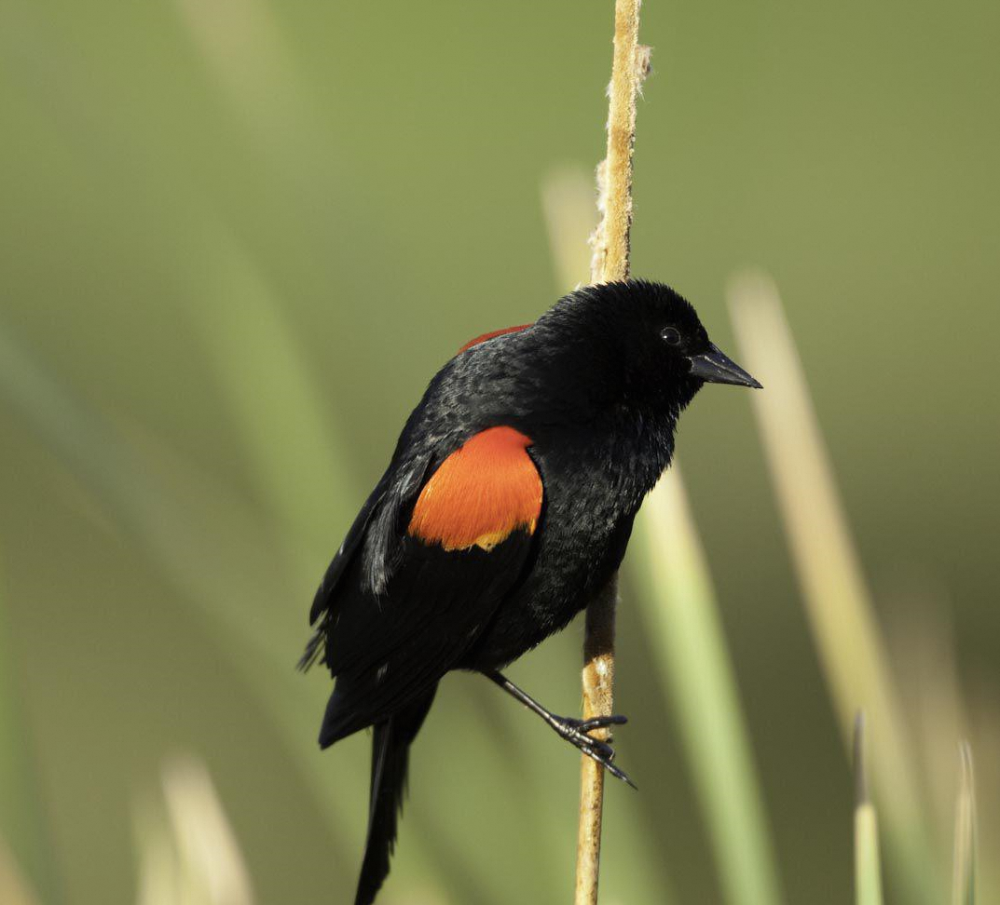

text: <|im_start|>system
You are a helpful assistant.<|im_end|>
<|im_start|>user
What kind of bird is this? Please give its name in Chinese and English.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

This bird is a Red-winged Blackbird (红翅黑鹂).


In [9]:
image_path = "assets/universal_recognition/unireco_bird_example.jpg"
prompt = "What kind of bird is this? Please give its name in Chinese and English."

image = Image.open(image_path)
display(image)

response = inference(image_path, prompt)
print(response)

##### 1.2 Multi images recognition 

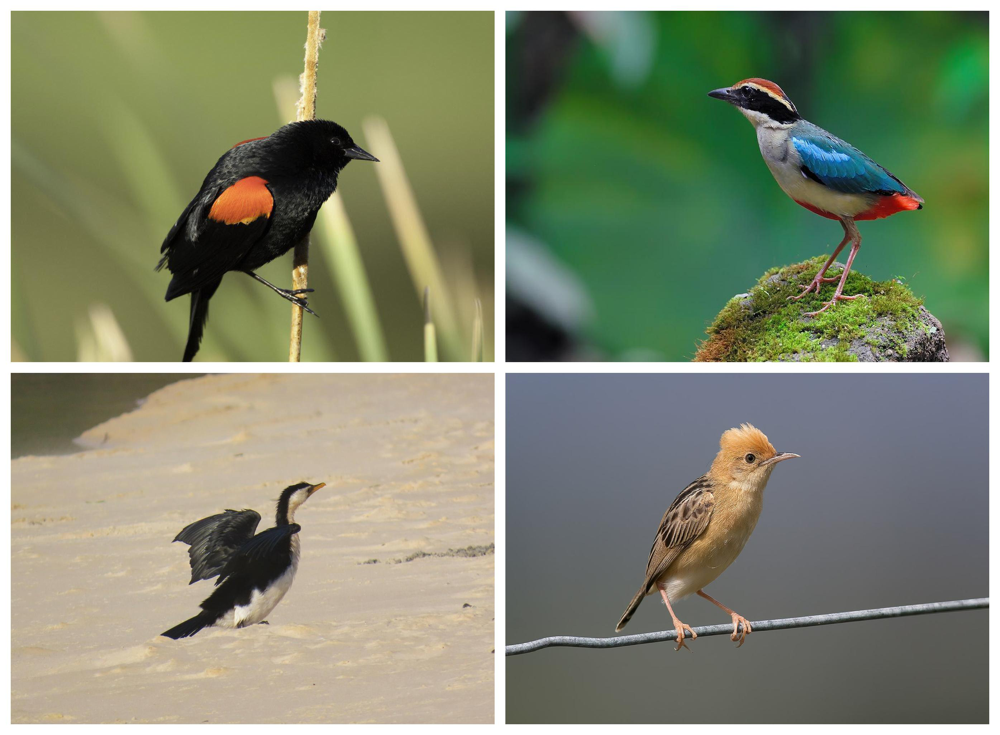

text: <|im_start|>system
You are a helpful assistant.<|im_end|>
<|im_start|>user
What are these birds? Please give their names in Chinese and English.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

1. 红翅黑鹂 (Red-winged Blackbird)
2. 仙八色鸫 (Indian Fairy Pitta)
3. 小斑鸬鹚 (Little Pied Cormorant)
4. 棕扇尾莺 (Brown Cisticola)


In [8]:
image_path = "./assets/universal_recognition/unireco_birds_example.jpg"
prompt = "What are these birds? Please give their names in Chinese and English."

image = Image.open(image_path)
display(image)

response = inference(image_path, prompt)
print(response)

Or you can try other challenging categories like landmark recognition, celebrity recognition, etc.

#### 2. Landmarks Recognition

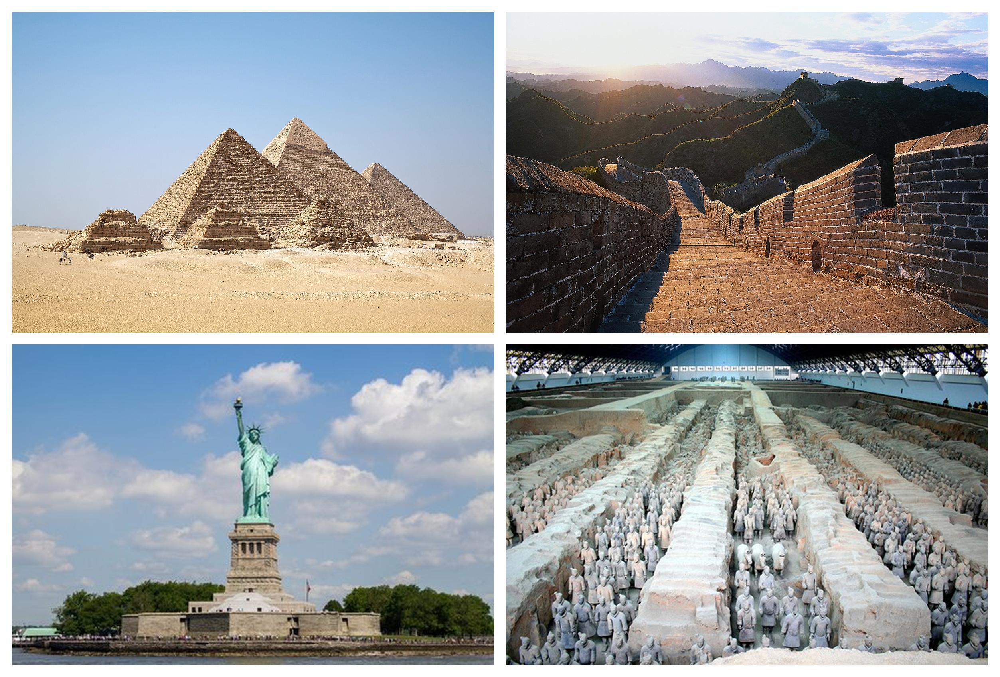

text: <|im_start|>system
You are a helpful assistant.<|im_end|>
<|im_start|>user
What are these attractions? Please give their names in Chinese and English.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

这些景点分别是：

1. 埃及金字塔（Pyramids of Giza）
2. 中国长城（Great Wall of China）
3. 自由女神像（Statue of Liberty）
4. 秦始皇兵马俑（Terracotta Army of Emperor Qin Shi Huang）


In [6]:
image_path = "./assets/universal_recognition/unireco_landmarks_example.jpg"
prompt = "What are these attractions? Please give their names in Chinese and English."

image = Image.open(image_path)
display(image)

response = inference(image_path, prompt)
print(response)

#### 3. Celebrities Recognition

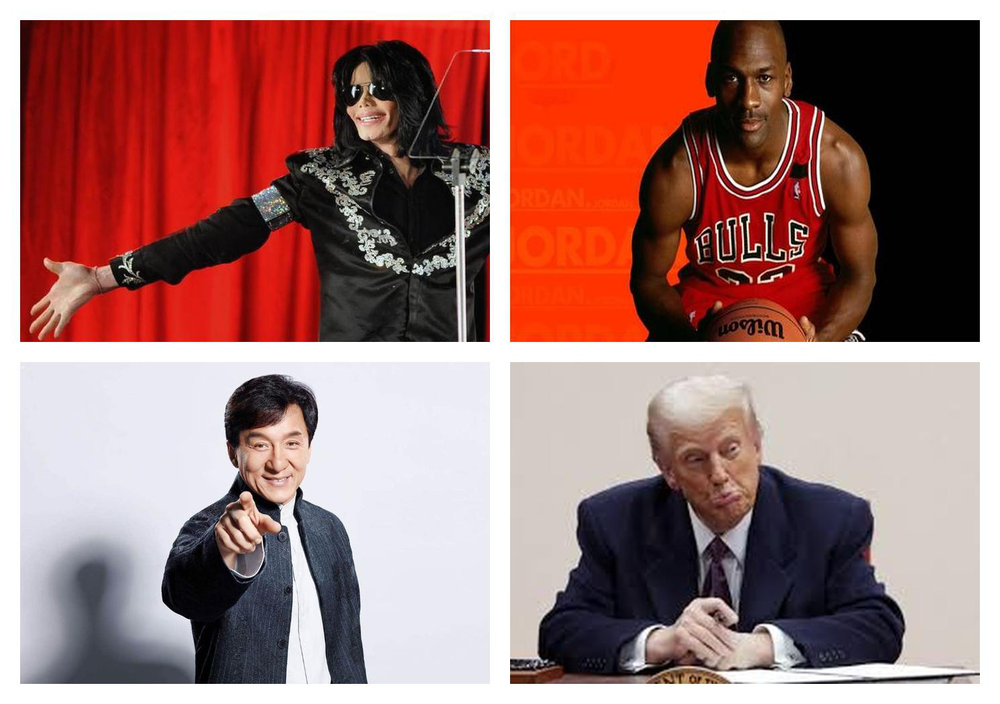

text: <|im_start|>system
You are a helpful assistant.<|im_end|>
<|im_start|>user
Who are these in this picture? Please give their names in Chinese and English.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

这张图片中有四位名人：

1. 迈克尔·杰克逊（Michael Jackson）
2. 迈克尔·乔丹（Michael Jordan）
3. 成龙（Jackie Chan）
4. 唐纳德·特朗普（Donald Trump）


In [7]:
image_path = "./assets/universal_recognition/unireco_celebrities_example.jpg"
prompt = "Who are these in this picture? Please give their names in Chinese and English."

image = Image.open(image_path)
display(image)

response = inference(image_path, prompt)
print(response)